<a href="https://colab.research.google.com/github/bsmoores/AI-portfolio/blob/main/Final_Project_Notebook_Hahn_Stats_24.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Final Project Notebook - Spring 2024

In [1]:
import matplotlib.pyplot as plt #Matplotlib is a plotting library for Python, and pyplot is a module within Matplotlib that provides a MATLAB-like interface for creating plots and visualizations.
import imageio #Imageio is a library for reading and writing a wide range of image data, including animated images (e.g., GIFs).
import torch #PyTorch is an open-source machine learning library for Python, and torchvision is a package that provides access to popular datasets, model architectures, and image transformations for computer vision tasks.
import torchvision #Transforms in torchvision are used to preprocess images before feeding them into a neural network model. They can perform operations such as resizing, cropping, normalization, and data augmentation.
from torchvision import models, transforms #NumPy is a fundamental package for scientific computing in Python, providing support for large multi-dimensional arrays and matrices, along with a collection of mathematical functions to operate on these arrays.
import numpy as np # NumPy is a fundamental package for scientific computing in Python, providing support for large multi-dimensional arrays and matrices, along with a collection of mathematical functions to operate on these arrays.
from torchvision.models import * #PIL (Python Imaging Library) is a library for opening, manipulating, and saving many different image file formats. The Image module provides a class by the same name for representing and working with images.
from PIL import Image #PIL (Python Imaging Library) is a library for opening, manipulating, and saving many different image file formats. The Image module provides a class by the same name for representing and working with images.
import requests #Requests is a Python HTTP library for making HTTP requests. It allows you to send HTTP requests easily and handle responses seamlessly.
from torchvision import models #These modules provide access to pre-trained deep learning models for various tasks, such as image classification, object detection, and segmentation. Models like ResNet, VGG, and DenseNet are available through these modules.
from torchsummary import summary #Torchsummary is a utility for summarizing PyTorch model architectures, providing information about the layers, parameters, and output shapes of the model.

In [2]:
def plot(x):    #creates a plot to display an image represented by the input array x.
    fig, ax = plt.subplots()  #The returned fig is the Figure object representing the entire figure, and ax is the Axes object representing the plot area within the figure.
    im = ax.imshow(x,cmap='gray')   # image should be displayed in grayscale colormap.
    ax.axis('off') #hiding the axis markers and labels from the plot.
    fig.set_size_inches(20, 20) #It sets the size of the figure to be 20x20 inches.
    plt.show() #displaying the image with the specified settings.

In [3]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png') #You've loaded an image from a URL using the imageio.imread() function. The image is stored in the variable im.

<ipython-input-3-2086ec9e0cf6>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


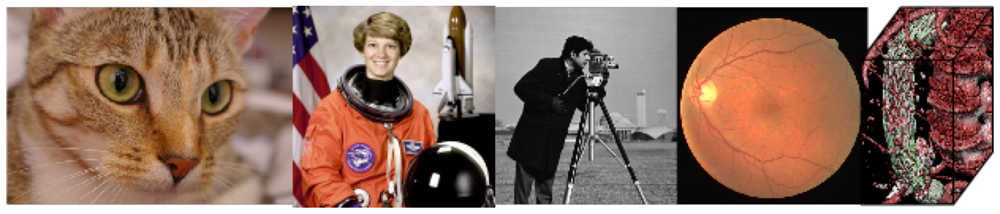

In [4]:
plot(im)  #This will print the shape (dimensions) of the image array and its data type.

In [5]:
net = alexnet(pretrained=True).cuda(0) #AlexNet is a popular deep learning model architecture that has been pre-trained on the ImageNet dataset for image classification tasks.

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 91.1MB/s]


In [6]:
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406],
   std=[0.229, 0.224, 0.225]   #Normalizes the tensor by subtracting the mean and dividing by the standard deviation for each channel.
)
preprocess = transforms.Compose([
   transforms.Resize(256), #Resizes the input image to have a height and width of 256 pixels.
   transforms.CenterCrop(224),  #Crops the center of the resized image to have a square shape with a side length of 224 pixels.
   transforms.ToTensor(),  #Converts the PIL Image or numpy.ndarray to a PyTorch tensor.
   normalize
])

In [7]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')
#will display the image stored in the variable im using Matplotlib's imshow() function.

<ipython-input-7-772805ffc2cf>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


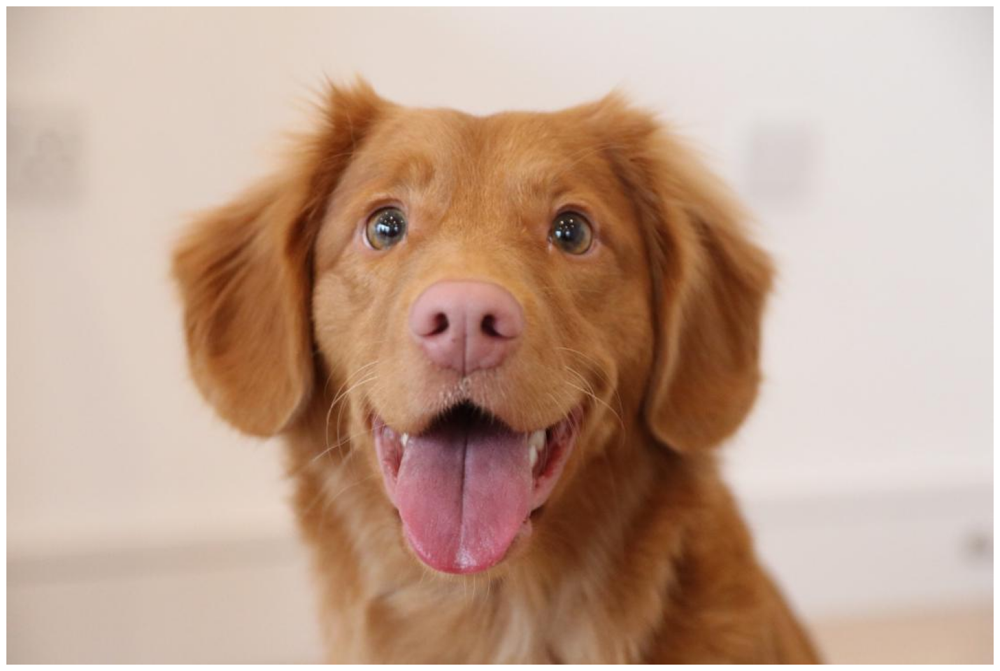

In [8]:
plot(im) #This will print the shape (dimensions) of the image array and its data type.

In [9]:
image = Image.fromarray(im) #convert to pil

In [10]:
img_tensor = preprocess(image) #

In [11]:
img_tensor = img_tensor.unsqueeze_(0)

In [12]:
img_tensor.shape

torch.Size([1, 3, 224, 224])

In [13]:
img_variable = torch.tensor(img_tensor).cuda(0)

<ipython-input-13-a3c4eb55103d>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [14]:
out = net(img_variable)

In [15]:
label_index = out.cpu().data.numpy().argmax()

In [16]:
label_index

220

In [17]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])

In [18]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'

In [19]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}

In [20]:
print(labels[label_index])

Sussex spaniel


In [21]:
for i in range(10):
    print(labels[top_list[i]])

Sussex spaniel
Irish setter, red setter
golden retriever
Brittany spaniel
tennis ball
vizsla, Hungarian pointer
cocker spaniel, English cocker spaniel, cocker
clumber, clumber spaniel
Welsh springer spaniel
Blenheim spaniel


In [22]:
net

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [23]:
summary(net, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [24]:
out = net.features[0](img_variable).cpu().detach().numpy()

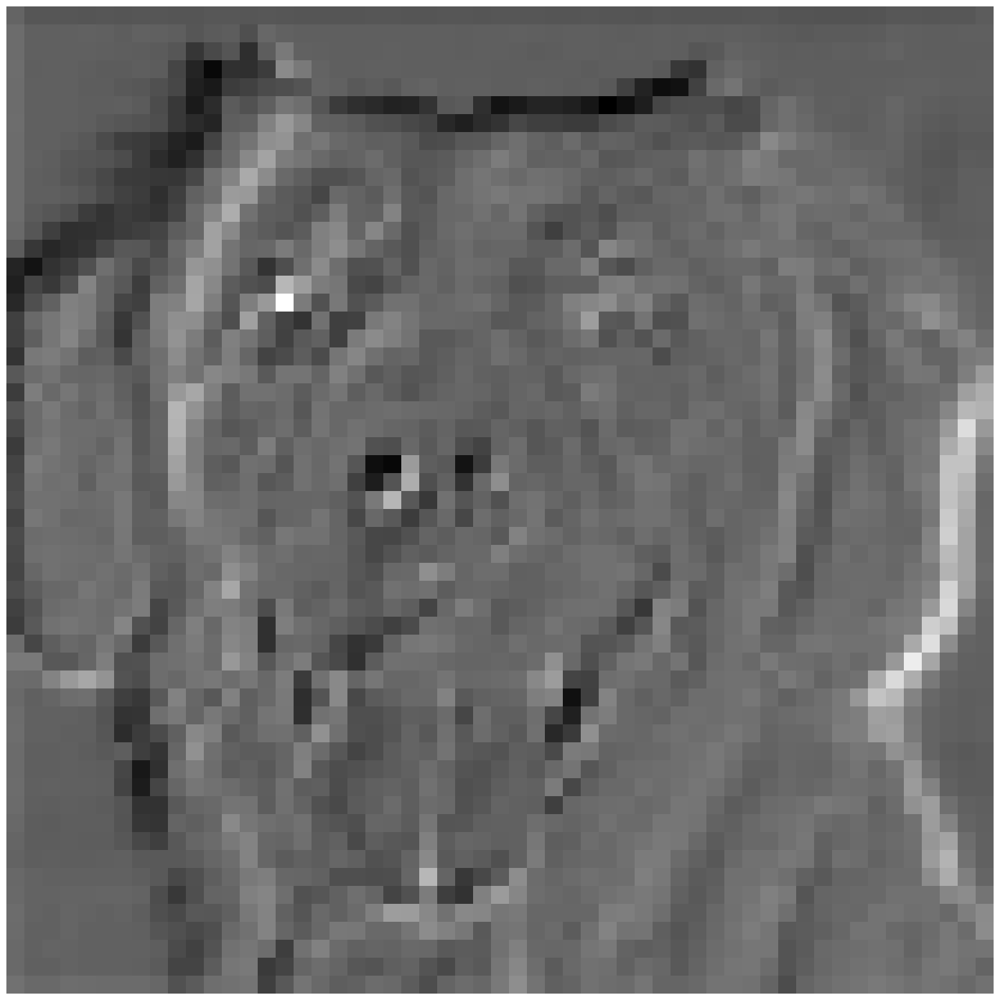

In [25]:
plot(out[0,0,:,:])

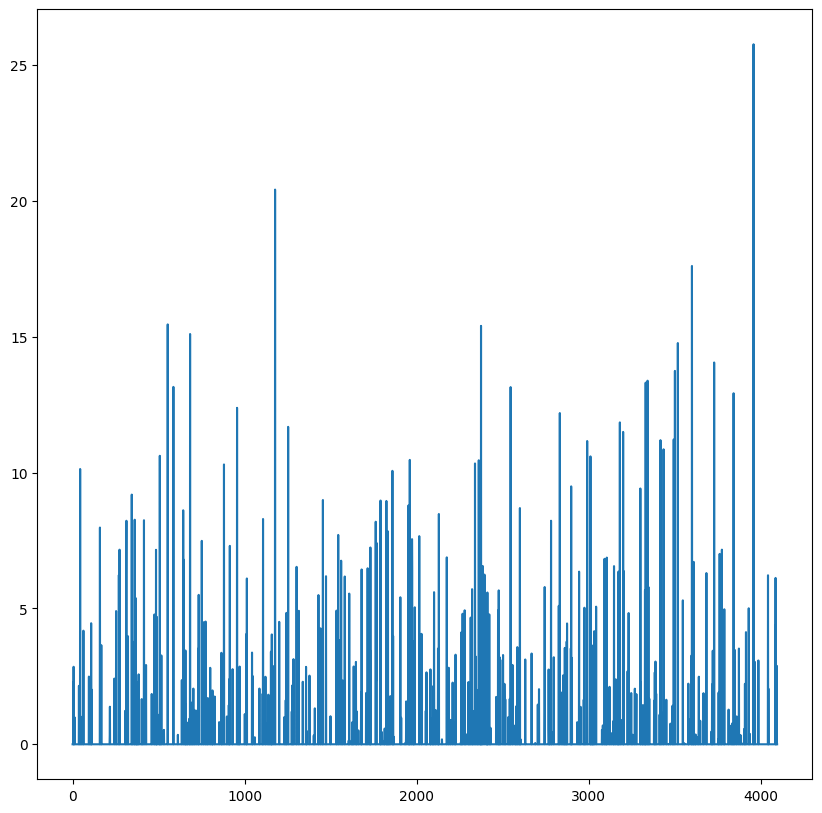

In [26]:
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
fig = plt.gcf()
fig.set_size_inches(10, 10)

In [27]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


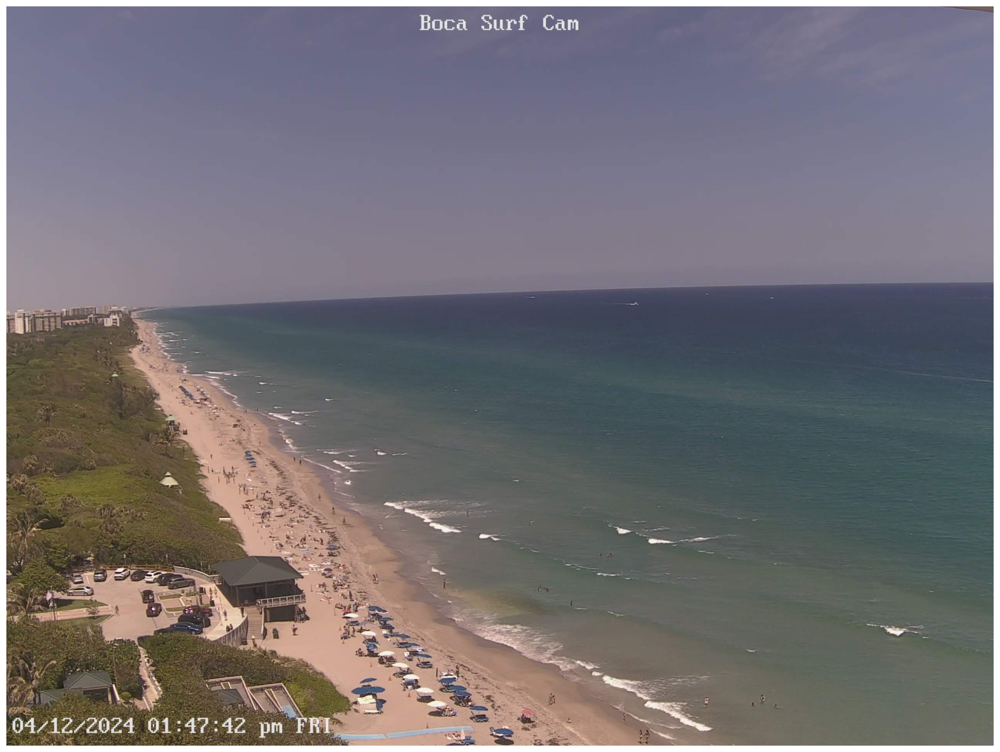

In [28]:
plot(im)

In [29]:
def load_im(im):
    image = Image.fromarray(im) #convert to pil
    img_tensor = preprocess(image)
    img_tensor = img_tensor.unsqueeze_(0)
    img_variable = torch.tensor(img_tensor).cuda(0)
    return img_variable

In [30]:
out = net(load_im(im))

<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [31]:
def inference(im):
    out = net(load_im(im))
    label_index = out.cpu().data.numpy().argmax()
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
    print(labels[label_index])
    print('____')
    for i in range(10):
        print(labels[top_list[i]])

In [32]:
inference(im)

promontory, headland, head, foreland
____
promontory, headland, head, foreland
seashore, coast, seacoast, sea-coast
cliff, drop, drop-off
sandbar, sand bar
valley, vale
breakwater, groin, groyne, mole, bulwark, seawall, jetty
lakeside, lakeshore
volcano
dam, dike, dyke
loggerhead, loggerhead turtle, Caretta caretta


<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [33]:
%%capture
!pip install wandb
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
from flashtorch.utils import apply_transforms
import wandb as wb

In [34]:
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))

In [35]:
def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()

In [36]:
def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id

def get_slides(url):
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images

def load(image):

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [37]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}

In [38]:
model = alexnet(weights='DEFAULT').to(device)
model.eval();

In [39]:
url = "https://docs.google.com/presentation/d/1KII8ffK5_2IbSx2ngqnAV2CgSmx2kFia33BKVsdD_Sk/edit#slide=id.g2b792cddafc_0_0"

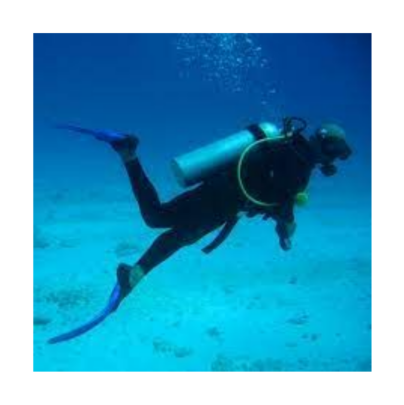

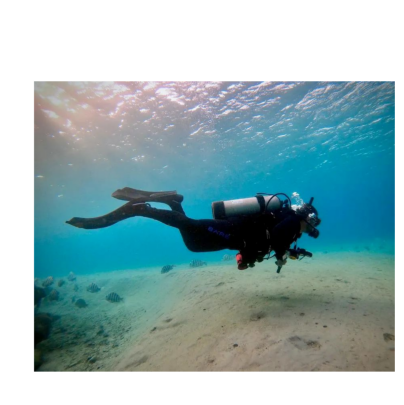

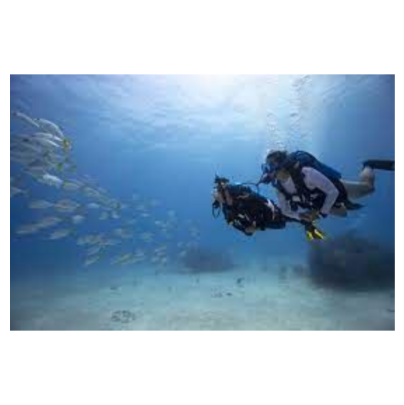

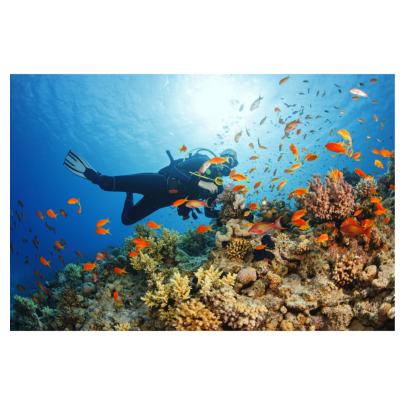

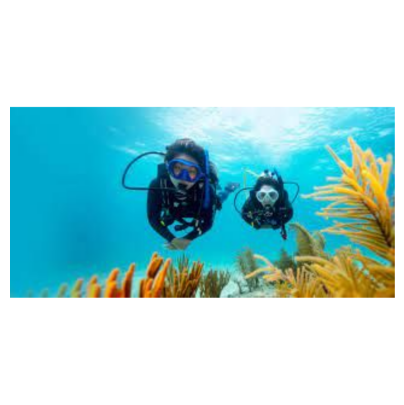

...

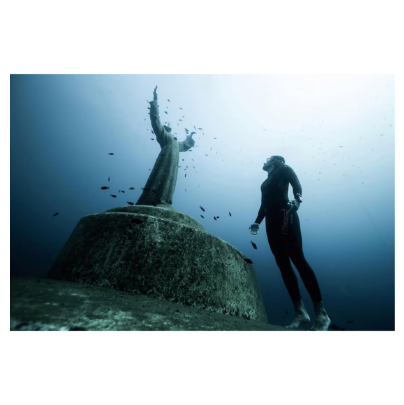

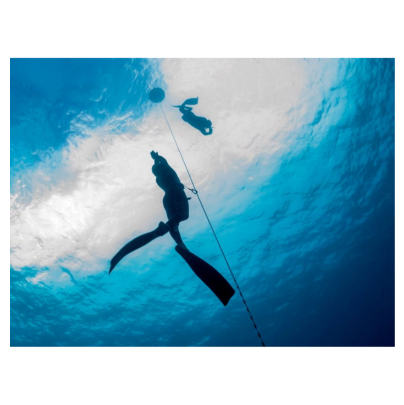

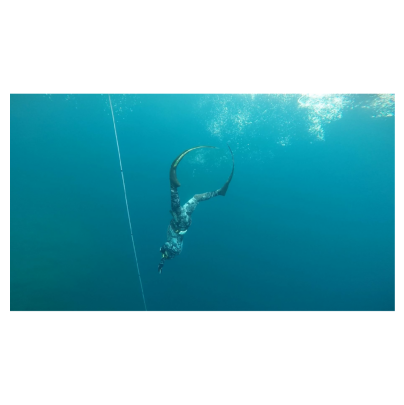

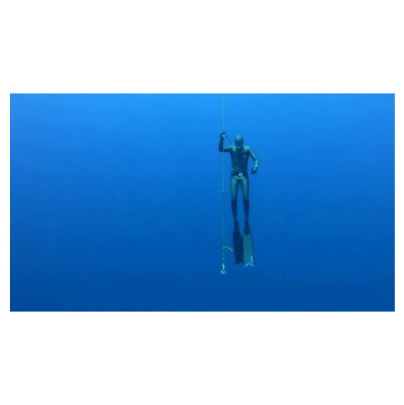

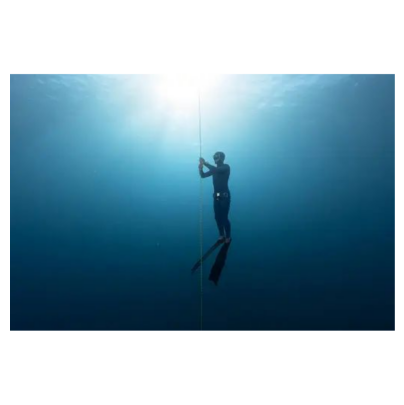

In [40]:
images = []

for image in get_slides(url):

    plot(image)

    images.append(load(image))

images = torch.vstack(images)

In [41]:
images.shape

torch.Size([50, 3, 224, 224])

In [42]:
model(images)

tensor([[ 1.7924e-01, -8.8498e-01,  4.1165e+00,  ..., -2.5743e+00,
         -3.4732e+00,  1.6829e+00],
        [ 2.8370e+00, -1.3130e+00,  7.8734e+00,  ..., -9.4672e-01,
         -5.2726e+00,  1.9353e+00],
        [-7.8406e-01, -1.8435e+00,  2.3830e+00,  ..., -3.7747e+00,
         -2.4364e+00,  4.5674e-01],
        ...,
        [-1.8508e+00, -1.2677e+00,  4.5749e+00,  ..., -3.9186e+00,
          4.5016e-03,  3.7789e+00],
        [-2.2426e+00, -3.3417e-01,  1.2209e+00,  ..., -4.1966e+00,
          5.7789e-03,  2.8931e+00],
        [-2.1622e+00, -1.2675e+00,  3.6222e+00,  ..., -3.8414e+00,
         -5.9908e-01,  3.2358e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)

In [43]:
y = model(images)

In [44]:
y.shape

torch.Size([50, 1000])

In [45]:
guesses = torch.argmax(y, 1).cpu().numpy()

In [46]:
for i in list(guesses):
    print(labels[i])

scuba diver
scuba diver
snowmobile
coral reef
hair slide
dugong, Dugong dugon
scuba diver
coral reef
scuba diver
ski
Labrador retriever
scuba diver
snorkel
scuba diver
scuba diver
ski
coral reef
ant, emmet, pismire
parachute, chute
Weimaraner
web site, website, internet site, site
coral reef
coral reef
snowmobile
scuba diver
snorkel
ski
scuba diver
balance beam, beam
snorkel
scuba diver
snowmobile
dugong, Dugong dugon
sea lion
scuba diver
killer whale, killer, orca, grampus, sea wolf, Orcinus orca
wallet, billfold, notecase, pocketbook
binder, ring-binder
scuba diver
binder, ring-binder
hook, claw
bubble
quill, quill pen
scuba diver
binder, ring-binder
killer whale, killer, orca, grampus, sea wolf, Orcinus orca
scuba diver
binder, ring-binder
binder, ring-binder
spotlight, spot


In [47]:
Y = np.zeros(50,)
Y[25:] = 1

In [48]:
Y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [49]:
X = y.detach().cpu().numpy()

In [50]:
X.shape

(50, 1000)

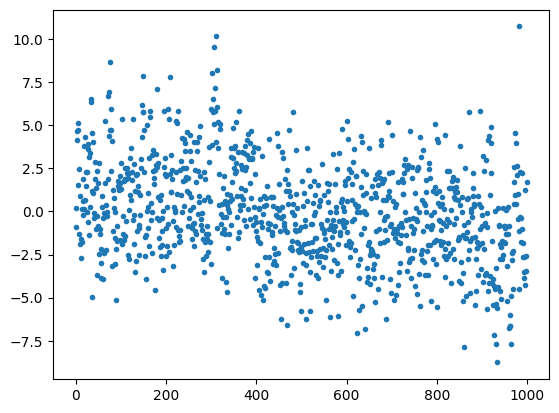

In [51]:
plt.plot(X[0],'.')

In [52]:
X[0]

array([ 1.79237306e-01, -8.84976804e-01,  4.11650658e+00,  4.66576529e+00,
        4.70622826e+00,  5.14249039e+00,  1.51921082e+00,  2.43580580e+00,
       -1.31242776e+00,  8.72759223e-01, -1.90778327e+00, -2.68646860e+00,
       -1.59766591e+00, -1.76579988e+00,  1.54816985e-01, -1.89935803e-01,
        6.25075221e-01,  1.85136104e+00,  3.77139902e+00,  1.54901922e-01,
        6.69545829e-01,  4.30948639e+00,  1.44992232e+00,  2.27130127e+00,
       -4.23019528e-02,  2.27608371e+00,  3.60072231e+00, -6.31380260e-01,
        3.92023897e+00,  3.15407157e+00, -1.37724328e+00,  2.81256109e-01,
        3.39388180e+00,  6.34619808e+00,  6.53547955e+00,  1.20167565e+00,
        4.51108503e+00, -4.96222830e+00,  4.02088070e+00,  1.03981090e+00,
       -1.15945384e-01, -3.91264617e-01,  1.87539482e+00,  2.88137627e+00,
        1.37675810e+00, -1.04341745e+00, -2.93349952e-01,  2.35679364e+00,
       -3.69072604e+00, -8.64202976e-01,  1.67094588e+00,  2.81007099e+00,
       -2.49218416e+00, -

In [53]:
np.argmax(X[0])

983

In [54]:
labels[948]

'Granny Smith'

In [55]:
top_ten = np.argsort(X[0])[::-1][0:10]

In [56]:
for i in top_ten:
    print(labels[i])

scuba diver
ant, emmet, pismire
rhinoceros beetle
black widow, Latrodectus mactans
cockroach, roach
ground beetle, carabid beetle
killer whale, killer, orca, grampus, sea wolf, Orcinus orca
Labrador retriever
fly
Staffordshire bullterrier, Staffordshire bull terrier


In [57]:
labels

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([  6.,  36., 100., 234., 281., 192., 101.,  39.,   8.,   3.]),
 array([-8.75540257, -6.80870819, -4.86201334, -2.91531897, -0.96862429,
         0.97807026,  2.92476487,  4.87145948,  6.81815386,  8.76484871,
        10.71154308]),
 <BarContainer object of 10 artists>)

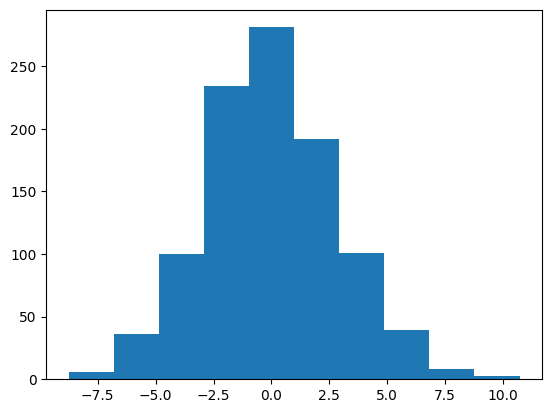

In [58]:
plt.hist(X[0])

In [59]:
X = GPU_data(X)
Y = GPU_data(Y)

In [60]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s

In [61]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

In [62]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

In [63]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

In [64]:
X.shape

torch.Size([50, 1000])

In [65]:
def get_batch(mode):
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

In [66]:
def model(x,w):

    return x@w[0]

In [67]:
def make_plots():

    acc_train = acc(model(x,w),y)

    wb.log({"acc_train": acc_train})

In [ ]:
wb.init(project="Linear_Model_Photo_1");
c = wb.config

c.h = 0.001
c.b = 4
c.epochs = 100000

w = [GPU(Truncated_Normal((1000,2)))]

optimizer = torch.optim.Adam(w, lr=c.h)

for i in range(c.epochs):

    x,y = get_batch('train')

    loss = cross_entropy(softmax(model(x,w)),y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    wb.log({"loss": loss})

    make_plots()


<IPython.core.display.Javascript object>